In [ ]:
import colorednoise as cn
import numpy as np
from matplotlib import pylab as plt
#input values
beta = 0
# the exponent: 0=white noite; 1=pink noise; 2=red noise, (also "brownian noise")
samples = 2**16                         # number of samples to generate (time series extension)
#Deffing some colores
A = cn.powerlaw_psd_gaussian(beta, samples)
#Ploting first subfiure
plt.plot(A, color='black', linewidth=1)
plt.title('Colored Noise for beta ='+str(beta))
plt.xlabel('Samples (time-steps)')
plt.ylabel('Amplitude(t)', fontsize='large')
plt.xlim(1,5000)
plt.show()

: 

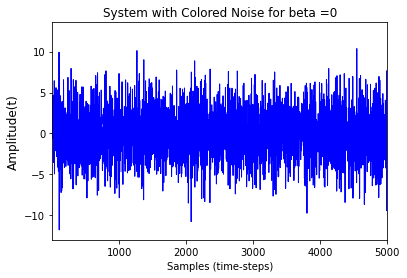

: 

In [ ]:
r = np.zeros(65536)
for k in range(4, 65536):
    r[k] = 1.8*r[k-1] - 2.0*r[k-2] + 1.2*r[k-3] - 0.4*r[k-4] + A[k]
    
#Ploting first subfiure
plt.plot(r, color='blue', linewidth=1)
plt.title('System with Colored Noise for beta ='+str(beta))
plt.xlabel('Samples (time-steps)')
plt.ylabel('Amplitude(t)', fontsize='large')
plt.xlim(1,5000)
plt.show()

In [ ]:
from scipy import *
from scipy.linalg import norm, pinv
from sklearn.cluster import KMeans
import random

class RBF:
     
    def __init__(self, indim, numCenters, outdim):
        self.indim = indim
        self.outdim = outdim
        self.numCenters = numCenters
        self.centers = [np.random.random(indim) for i in range(numCenters)]
        self.dmax = 1
        self.W = np.random.random((self.numCenters, self.outdim))
        self.sigma = 1
        self.beta = 0.5        
        self.epochs = 10
        self.seed = 0.2        
        self.learning_rate = 0.0005
        
    def _basisfunc(self, c, d):
        assert len(d) == self.indim
        return exp(-(norm(c-d)**2)/(2*self.sigma**2))
    
    def centros_dispersao(self, X):
        #""" X: matrix of dimensions n x indim """      
        # X ---- >>>>> r.reshape(-1,1)
        # choose random center vectors from training set
        kmeans = KMeans(n_clusters=self.numCenters, random_state=0).fit(X)
        self.centers = kmeans.cluster_centers_  
        self.dmax = max(self.centers) - min(self.centers)
        self.sigma = self.dmax/np.sqrt(2*self.numCenters)

    def treinamento(self,X,A):                      
        #gradient descent
        cache_loss = []
        for self.epoch in range(self.epochs):
            loss = np.zeros(X.shape[0])
            for i in range(4,X.shape[0]):
                #loss
                rbf_kernel = np.array([self._basisfunc(X[i-1], c) for c in self.centers]).reshape(1,-1)
                F1 = rbf_kernel.dot(self.W[0].T) + self.beta
                F2 = rbf_kernel.dot(self.W[1].T) + self.beta
                F3 = rbf_kernel.dot(self.W[2].T) + self.beta
                F4 = rbf_kernel.dot(self.W[3].T) + self.beta
                F = F1*X[i-1] + F2*X[i-2] + F3*X[i-3] + F4*X[i-4] + A[i] # A é o ruído colorido e foi calculado fora
                loss[i] = (X[i] - F).flatten() ** 2
                #error
                e = -(X[i] - F).flatten()
                print(e)
                #derivatives
                dw = rbf_kernel * e
                print(dw)
                db = e
                self.W[0] = self.W[0] - (self.learning_rate * dw*[1,1,1,1])
                self.W[1] = self.W[1] - (self.learning_rate * dw*[1,1,1,1])
                self.W[2] = self.W[2] - (self.learning_rate * dw*[1,1,1,1])
                self.W[3] = self.W[3] - (self.learning_rate * dw*[1,1,1,1])                   
                self.beta = self.beta - self.learning_rate * db
                print(self.beta)
            print(f'Epoch {self.epoch} - Loss: {np.mean(loss):.4f}')
            cache_loss.append(np.mean(loss))  
        return cache_loss
 
    def predicao(self,X,A):
        y_pred = []
        for i in range(X.shape[0]):
            rbf_kernel = np.array([self._basisfunc(X[i-1], c) for c in self.centers])
            F1 = rbf_kernel.dot(self.W[0].T) + self.beta
            F2 = rbf_kernel.dot(self.W[1].T) + self.beta
            F3 = rbf_kernel.dot(self.W[2].T) + self.beta
            F4 = rbf_kernel.dot(self.W[3].T) + self.beta
            F = F1*X[i-1] + F2*X[i-2] + F3*X[i-3] + F4*X[i-4] + A[i]
            y_pred.append(F)
        return np.array(y_pred)                 


: 

In [ ]:
rbf = RBF(1,4,4)

: 

In [ ]:
rbf.treinamento(r,A)

/tmp/ipykernel_35709/2671809517.py:23: DeprecationWarning: scipy.exp is deprecated and will be removed in SciPy 2.0.0, use numpy.exp instead
  return exp(-(norm(c-d)**2)/(2*self.sigma**2))


[-0.]
[[-0. -0. -0. -0.]]
[0.5]
[-0.54039008]
[[-0.1732805  -0.39055352 -0.37024273 -0.16356581]]
[0.5002702]
[-0.44566398]
[[-0.00083109 -0.00783315 -0.00652145 -0.00072639]]
[0.50049303]
[7.74019688]
[[0.62940613 2.3722026  2.14630132 0.57791294]]
[0.49662293]
[17.16751905]
[[16.82351672 11.41376016 12.06595416 16.93979683]]
[0.48803917]
[7.65634841]
[[5.45387208 2.38974787 2.62856199 5.62224436]]
[0.48421099]
[2.78835528]
[[2.71915885 1.81525169 1.92179039 2.74033125]]
[0.48281682]
[-0.46445042]
[[-0.16557002 -0.35478737 -0.33788269 -0.15671299]]
[0.48304904]
[-1.61542199]
[[-0.00125397 -0.0139804  -0.01146322 -0.00108613]]
[0.48385675]
[2.67218952]
[[0.00014559 0.00255639 0.00201145 0.00012306]]
[0.48252066]
[6.78250043]
[[0.07428667 0.47896881 0.41274499 0.06626729]]
[0.47912941]
[23.45461102]
[[15.08708336 22.80480927 22.41718907 14.5506267 ]]
[0.4674021]
[8.32074251]
[[1.63562195 0.36006773 0.42158424 1.7497211 ]]
[0.46324173]
[2.21865817]
[[0.00853416 0.00064097 0.00082742 0.00

KeyboardInterrupt: 

: 